# TeamDetector relabel flow

Notebook para inspeccionar visualmente el flujo `YOLO -> homografía -> TeamDetector` sobre `video_prueba_medio` y entender por qué ciertas detecciones salen de `player` hacia `referee` o `goalkeeper`.

In [1]:
from pathlib import Path

import pandas as pd
from IPython.display import display

from team_detector_relabel_flow_utils import (
    analyze_team_detector_video,
    build_distance_margin_plot,
    build_bootstrap_reference_figures,
    build_field_relabel_map,
    build_lab_scatter_3d,
    build_relabel_timeline,
    load_artifacts,
    show_frame_overlay,
)

PROJECT_ROOT = Path.cwd()
CONFIG_PATH = "../../config.yaml"
VIDEO_KEY = "video_prueba_medio"
MODEL_PATH = PROJECT_ROOT / "../../models/finetuning/yolov11m/weights/best.pt"
OUTPUT_DIR = PROJECT_ROOT / "../../output/analysis/team_detector_video_prueba_medio_best"
MAX_FRAMES = None  # usa 200 si quieres una pasada rápida
FRAME_STEP = 1
TEAM_COLORS = None  # déjalo en None para arrancar sin referencias iniciales

In [2]:
artifacts = analyze_team_detector_video(
    config_path=CONFIG_PATH,
    video_key=VIDEO_KEY,
    model_path=MODEL_PATH,
    output_dir=OUTPUT_DIR,
    max_frames=MAX_FRAMES,
    frame_step=FRAME_STEP,
    team_colors=TEAM_COLORS,
    verbose=True,
)
artifacts

**************************************************************************************************** /home/hegarc04/narrador-futbol/experiments/visualization/../../models/finetuning/yolov11m/weights/best.pt
Procesados 1 frames...
Procesados 10 frames...
Procesados 20 frames...
Procesados 30 frames...
Procesados 40 frames...
Procesados 50 frames...
Procesados 60 frames...
Procesados 70 frames...
Procesados 80 frames...
Procesados 90 frames...
Procesados 100 frames...
Procesados 110 frames...
Procesados 120 frames...
Procesados 130 frames...
Procesados 140 frames...
Procesados 150 frames...
Procesados 160 frames...
Procesados 170 frames...
Procesados 180 frames...
Procesados 190 frames...
Procesados 200 frames...


RelabelAnalysisArtifacts(output_dir=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_prueba_medio_best'), detections_csv=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_prueba_medio_best/detections.csv'), frames_jsonl=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_prueba_medio_best/frames.jsonl'), summary_json=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_prueba_medio_best/summary.json'))

In [3]:
detections_df, frames_df, summary = load_artifacts(OUTPUT_DIR)
display(pd.Series(summary))
display(detections_df.head())
display(frames_df.head())

video_path                  /home/hegarc04/narrador-futbol/data/partidoPru...
model_path                  /home/hegarc04/narrador-futbol/experiments/vis...
frames_processed                                                          200
detections_total                                                         5410
relabelled_total                                                          297
relabelled_to_referee                                                      99
relabelled_to_goalkeeper                                                  121
bootstrap_min_samples                           {'player': 60, 'referee': 15}
bootstrap_samples_used                          {'player': 65, 'referee': 24}
bootstrap_samples_json      /home/hegarc04/narrador-futbol/experiments/vis...
output_dir                  /home/hegarc04/narrador-futbol/experiments/vis...
dtype: object

,frame_idx,det_idx,bbox_x1,bbox_y1,bbox_x2,bbox_y2,bbox_w,bbox_h,confidence,class_yolo,...,ref_Equipo 2_b,ref_referee_l,ref_referee_a,ref_referee_b,upper_bound_Equipo 1,median_dist_Equipo 1,iqr_dist_Equipo 1,upper_bound_Equipo 2,median_dist_Equipo 2,iqr_dist_Equipo 2
0,0,0,329.996948,492.322906,364.887024,569.655884,34.890076,77.332977,0.869032,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,1,1310.173340,444.693054,1352.015869,517.101929,41.842529,72.408875,0.867256,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,1229.380127,429.819855,1264.796387,501.763641,35.416260,71.943787,0.857842,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,534.124390,686.313904,577.326172,784.872803,43.201782,98.558899,0.853238,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,358.785004,720.084473,393.260925,826.009155,34.475922,105.924683,0.851780,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,frame_idx,num_detections,homography_quality_status,homography_quality_score,field_positions_usable_for_tracking,team_colors,outfield_team_distance_stats,updated
0,0,31,good,0.806043,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},"{'player': False, 'referee': False}"
1,1,31,good,0.788088,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},"{'player': False, 'referee': False}"
2,2,27,good,0.803409,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},"{'player': False, 'referee': False}"
3,3,31,good,0.806230,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},"{'player': False, 'referee': False}"
4,4,28,good,0.783499,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},"{'player': False, 'referee': False}"


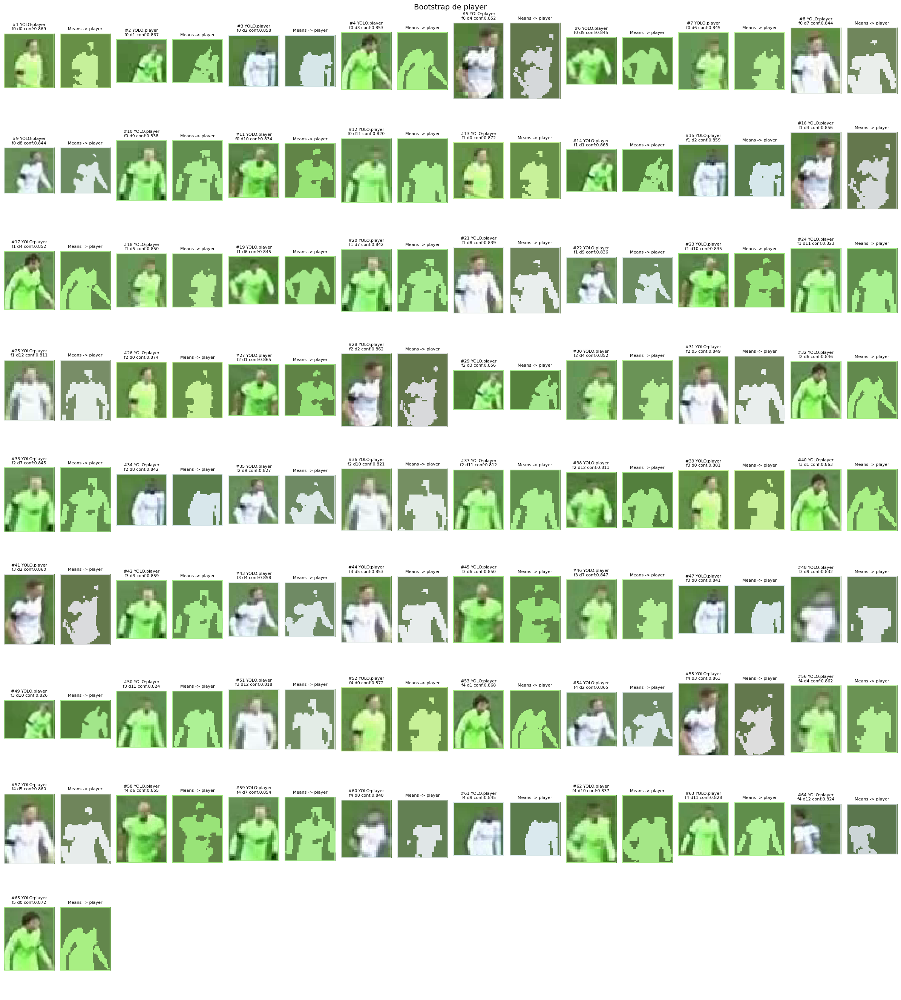

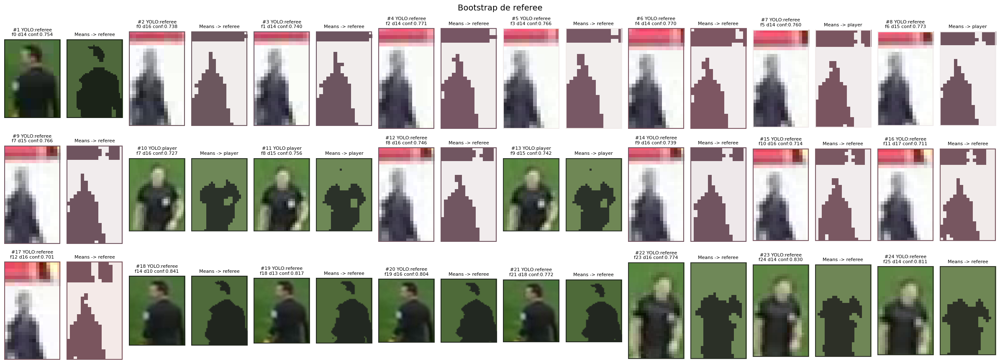

In [4]:
fig_bootstrap_player, fig_bootstrap_referee = build_bootstrap_reference_figures(OUTPUT_DIR, n_cols=8)


## Resumen rápido

- `distance_margin > 0`: la detección cae fuera del `upper_bound` del equipo más cercano.
- `new_possible_class`: decisión de `_check_possible_new_class`.
- `class_final`: salida final de `_reassign_class`.
- Los marcadores en rombo indican relabel.

In [5]:
summary_table = pd.DataFrame(
    {
        "detecciones": [len(detections_df)],
        "relabel_total": [int(detections_df['relabelled'].sum())],
        "player/ref -> referee": [int(detections_df['relabeled_to_referee'].sum())],
        "player/ref -> goalkeeper": [int(detections_df['relabeled_to_goalkeeper'].sum())],
        "frames": [int(detections_df['frame_idx'].nunique())],
    }
)
display(summary_table)

display(
    detections_df[
        [
            'class_yolo', 'class_final', 'new_possible_class', 'reason_path', 'team_final'
        ]
    ]
    .value_counts(dropna=False)
    .rename('count')
    .reset_index()
    .head(20)
)

,detecciones,relabel_total,player/ref -> referee,player/ref -> goalkeeper,frames
0,5410,297,99,121,200


,class_yolo,class_final,new_possible_class,reason_path,team_final,count
0,player,player,player,new_possible:player->reassign:player,Equipo 1,2158
1,player,player,player,new_possible:player->reassign:player,Equipo 2,2052
2,referee,referee,NaN,kept_class,NaN,274
3,ball,ball,NaN,non_candidate_class,NaN,218
4,referee,referee,referee,new_possible:referee->reassign:referee,NaN,134
5,player,player,NaN,kept_class,NaN,129
6,player,goalkeeper,goalkeeper,new_possible:goalkeeper->reassign:goalkeeper,NaN,119
7,player,referee,referee,new_possible:referee->reassign:referee,NaN,97
8,player,player,NaN,kept_class,Equipo 2,72
9,referee,player,player,new_possible:player->reassign:player,Equipo 2,61


In [6]:
fig_lab = build_lab_scatter_3d(detections_df, only_relabelled=False, include_spheres=True)
fig_lab.show()

In [7]:
fig_lab_relabel = build_lab_scatter_3d(
    detections_df,
    only_relabelled=True,
    include_spheres=True,
    title='Solo detecciones relabeleadas en LAB',
)
fig_lab_relabel.show()

In [8]:
fig_field = build_field_relabel_map(detections_df)
fig_field.show()

In [9]:
fig_timeline = build_relabel_timeline(detections_df)
fig_timeline.show()

fig_margin = build_distance_margin_plot(detections_df)
fig_margin.show()

In [10]:
relabel_cases = detections_df[detections_df['relabelled']].copy()
interesting = relabel_cases[
    [
        'frame_idx', 'det_idx', 'class_yolo', 'class_final', 'new_possible_class', 'reason_path',
        'field_x_m', 'field_y_m',
        'distance_before_equipo_1', 'distance_before_equipo_2',
        'upper_bound_Equipo 1', 'upper_bound_Equipo 2',
        'can_be_ref', 'can_be_goalkeeper'
    ]
].sort_values(['frame_idx', 'det_idx'])
display(interesting.head(50))

,frame_idx,det_idx,class_yolo,class_final,new_possible_class,reason_path,field_x_m,field_y_m,distance_before_equipo_1,distance_before_equipo_2,upper_bound_Equipo 1,upper_bound_Equipo 2,can_be_ref,can_be_goalkeeper
162,5,14,referee,player,NaN,reassign_only:referee->player,49.165092,1.092121,57.212532,7.805669,16.082219,11.900156,True,False
167,5,19,player,goalkeeper,goalkeeper,new_possible:goalkeeper->reassign:goalkeeper,93.780289,36.475765,61.548386,56.791004,16.082219,11.900156,False,True
189,6,15,referee,player,NaN,reassign_only:referee->player,49.192429,1.210363,57.927063,8.722139,16.082219,11.900156,True,False
194,6,20,player,goalkeeper,goalkeeper,new_possible:goalkeeper->reassign:goalkeeper,93.786285,36.465347,52.946556,51.849201,16.082219,11.900156,False,True
197,6,23,referee,player,NaN,reassign_only:referee->player,49.275280,0.865427,57.188957,11.441359,16.082219,11.900156,True,False
223,7,20,player,goalkeeper,goalkeeper,new_possible:goalkeeper->reassign:goalkeeper,93.750557,36.531883,52.875084,55.677959,16.082219,11.900156,False,True
226,7,23,referee,player,NaN,reassign_only:referee->player,49.281288,0.874983,56.846424,11.656720,16.082219,11.900156,True,False
253,8,23,player,goalkeeper,goalkeeper,new_possible:goalkeeper->reassign:goalkeeper,93.786263,36.505573,51.276718,50.599495,16.082219,11.900156,False,True
254,8,24,referee,player,NaN,reassign_only:referee->player,49.267273,0.720057,56.809624,10.760277,16.082219,11.900156,True,False
282,9,23,player,goalkeeper,goalkeeper,new_possible:goalkeeper->reassign:goalkeeper,93.850777,36.381828,106.691193,120.451523,16.082219,11.900156,False,True


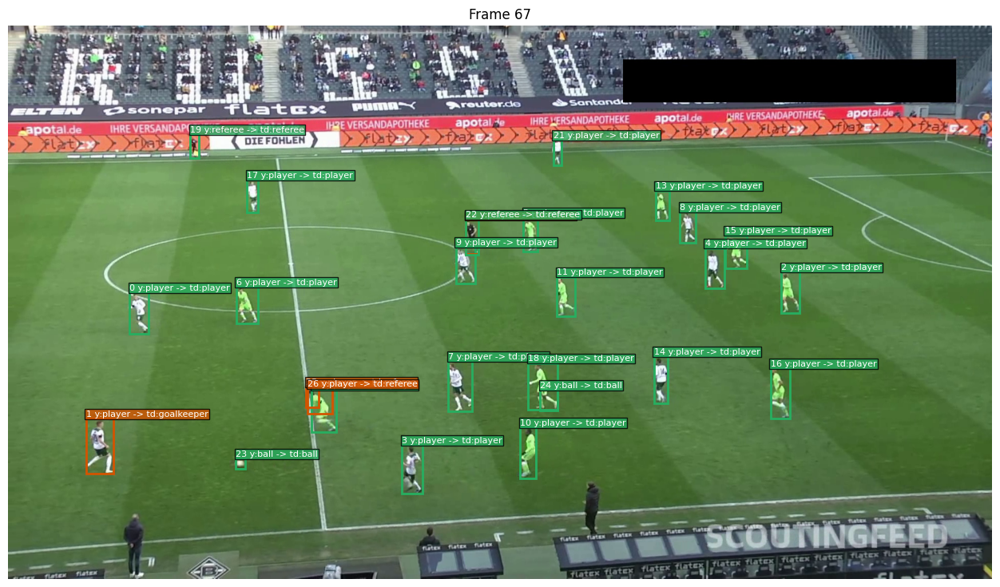

In [11]:
FRAME_TO_INSPECT = int(relabel_cases['frame_idx'].mode().iloc[0]) if not relabel_cases.empty else 0
fig = show_frame_overlay(detections_df, '../../data/partidoPrueba/partido_medio.mp4', FRAME_TO_INSPECT)

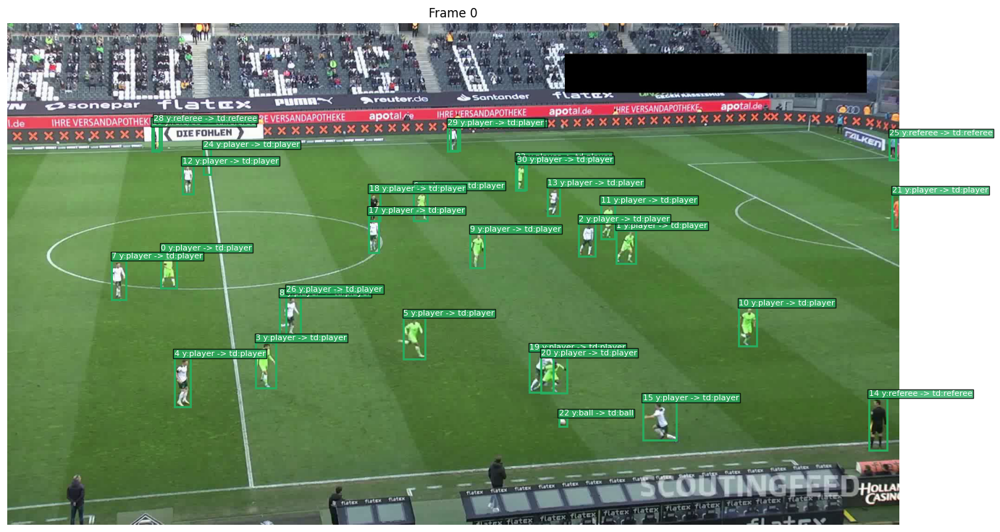

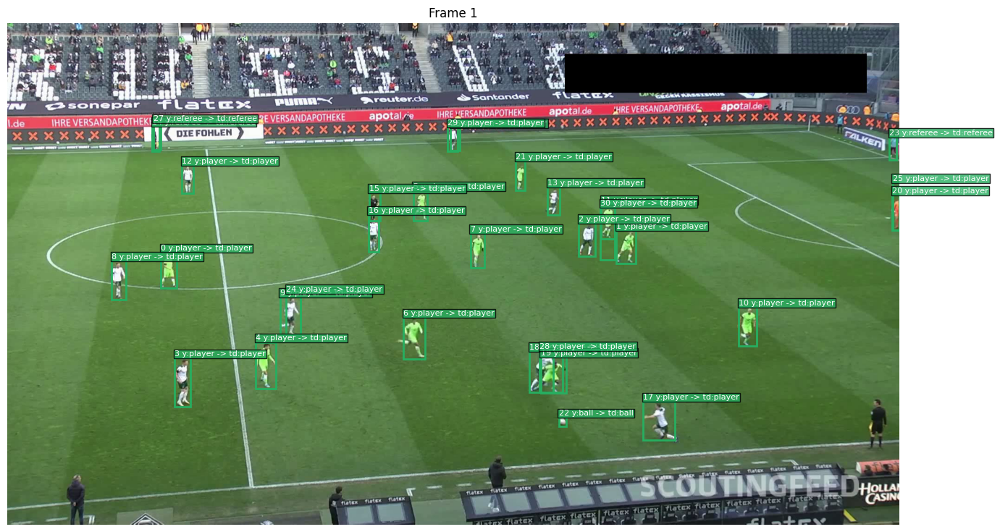

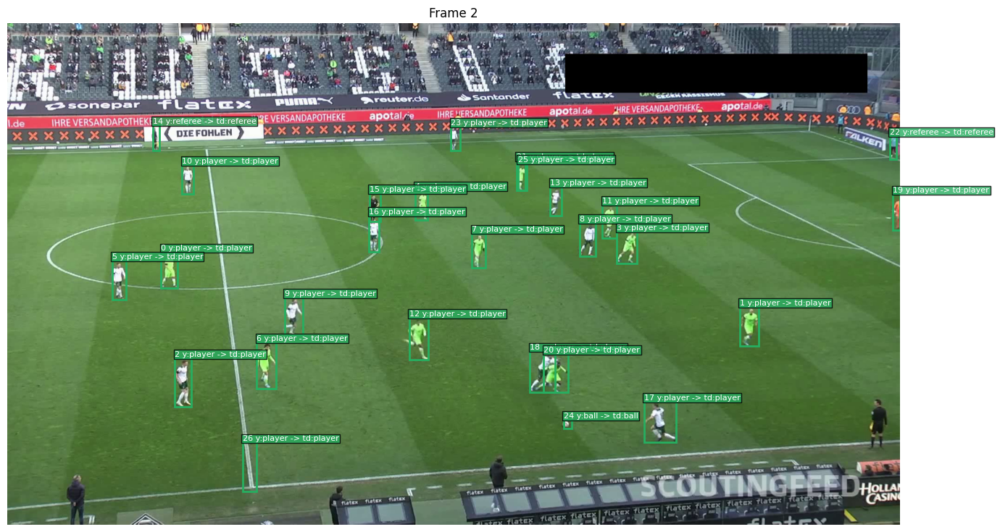

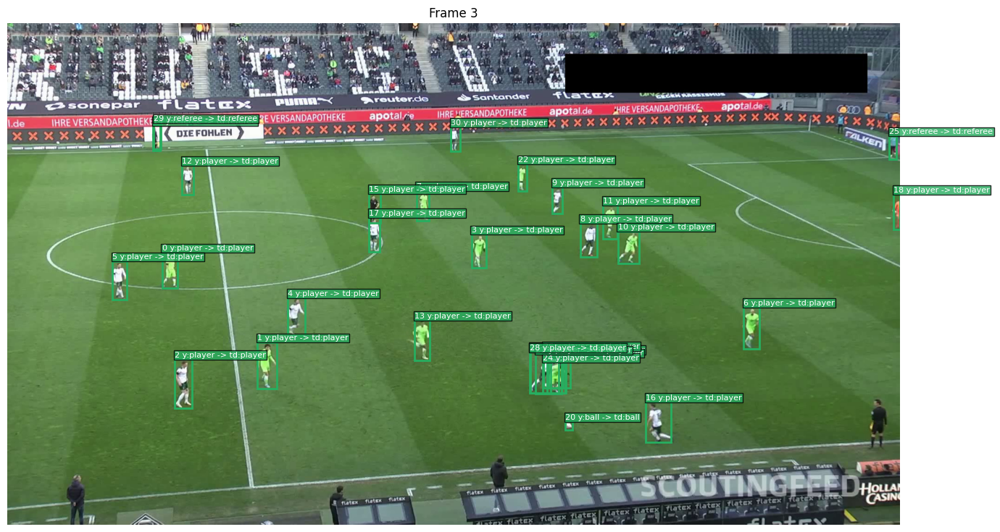

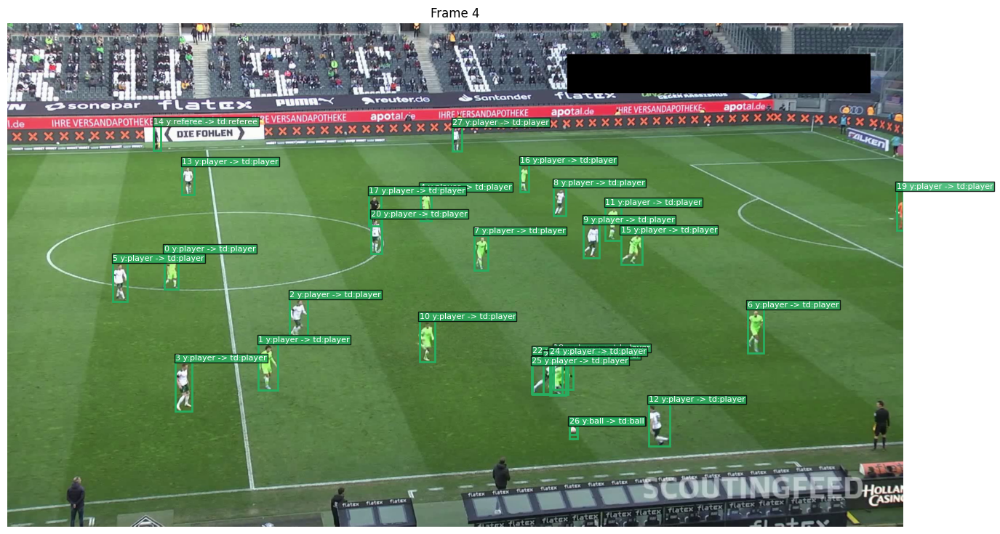

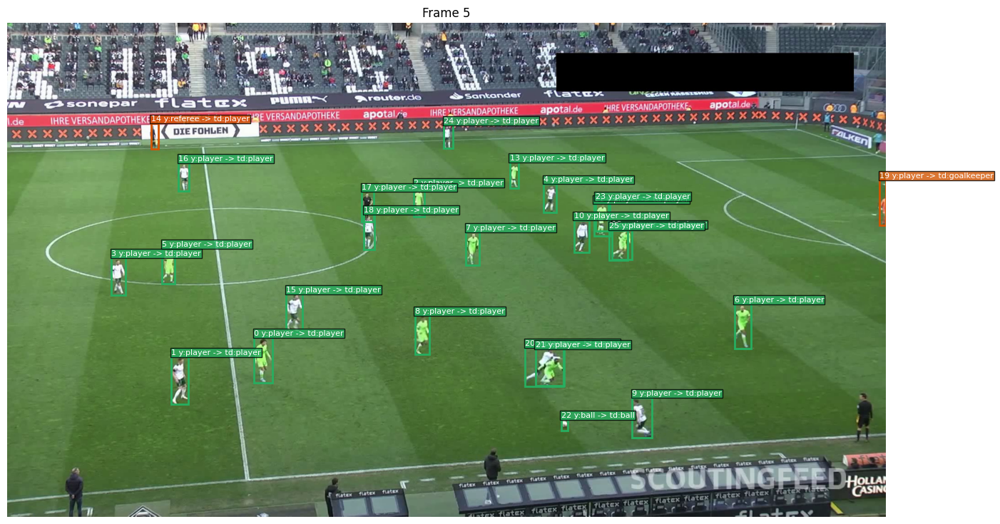

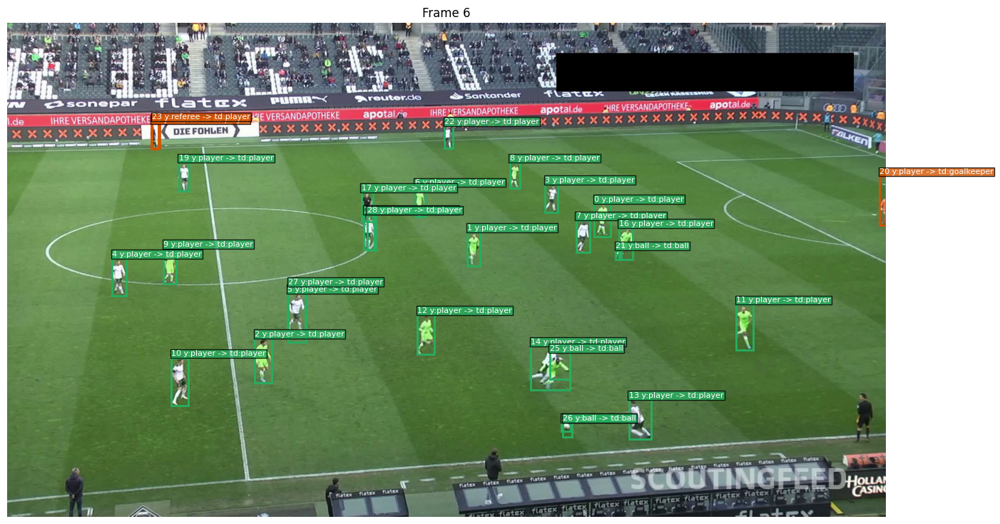

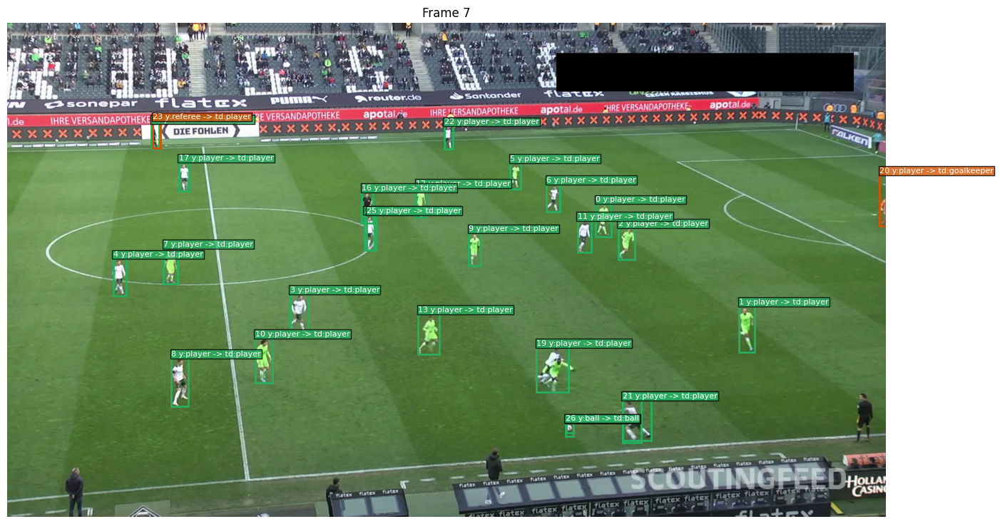

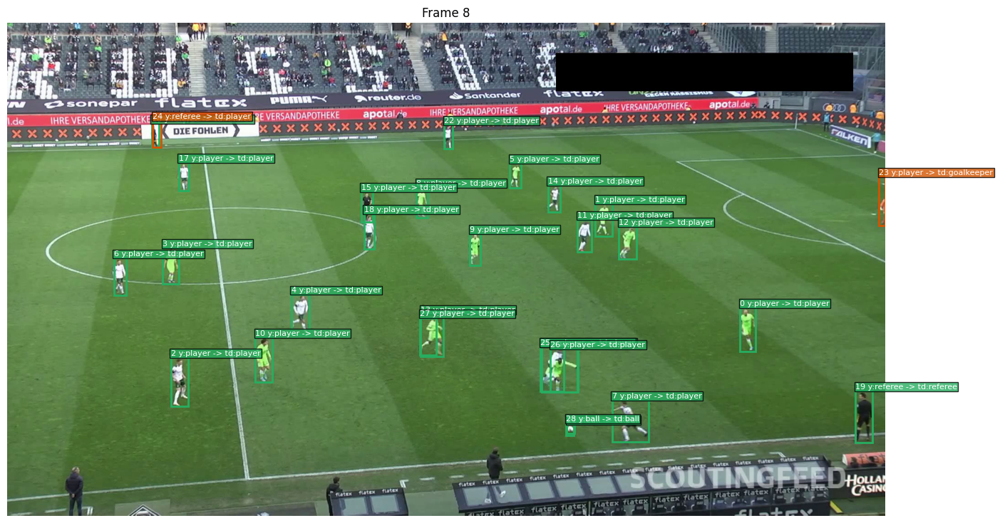

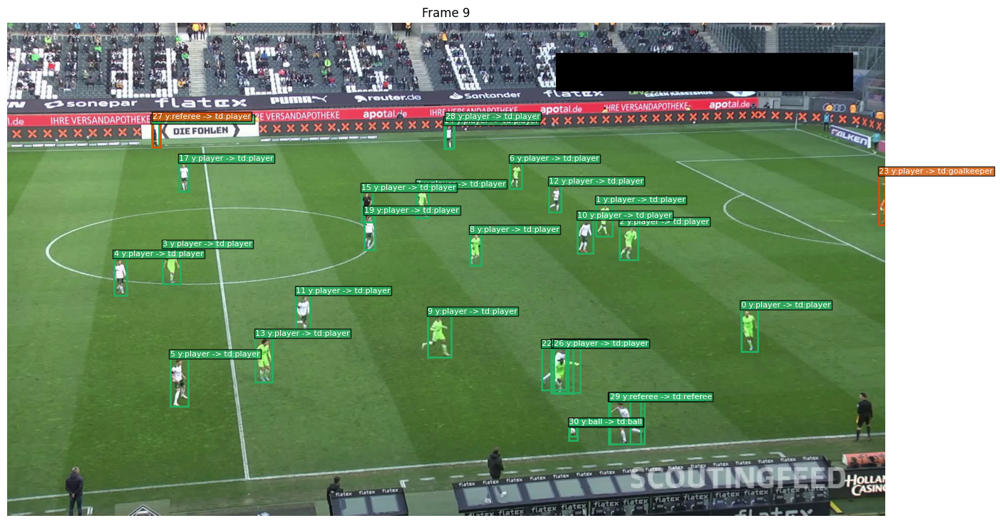

In [12]:
for i in range(0, 10):
    fig = show_frame_overlay(detections_df, '../../data/partidoPrueba/partido_medio.mp4', i)